In [1]:
%matplotlib inline

from collections import OrderedDict
from pathlib import Path

import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

import pyLDAvis
from pyLDAvis.sklearn import prepare

from wordcloud import WordCloud
from termcolor import colored

# sklearn for feature extraction & modeling
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import train_test_split
import joblib
import re

# Gensim
from pprint import pprint
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer

# Re-add the additional stop words since we are recreating the document-term matrix
add_stop_words = ['like', 'im', 'said','rsquo','euro','&#39;','...','..','39',"'s",
 '....',
 '10',
 '15',
 '20',
 '30','acirc',"n't",'n/a']
stop_words = text.ENGLISH_STOP_WORDS.union(add_stop_words)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

C:\Users\ADMIN\anaconda3\lib\site-packages\scipy\sparse\sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
sns.set_style('white')
plt.rcParams['figure.figsize'] = (14.0, 8.7)

In [4]:
pyLDAvis.enable_notebook()

In [5]:
data_ov = pd.read_csv(r'Negative_Data.csv')

In [6]:
data_ov

,REVIEW_ID,MEMBER_ID,Reviews,sentiment_label
0,a2p1U000000Ro7KQAS,0011U00000rjF6eQAE,everything dr gray listened and offered feedback i never felt rushed i had an awesome appt thank youvant think of anything,Negative
1,a2p3g000000L0RrAAK,0011U00000riHDHQA2,friendly and professional staff clean and calm waiting room,Negative
2,a2p1U000000RoGYQA0,0011U00000rjxhBQAQ,i love that my doctor spends time with me and follows up on things we talked about during my last appointment i never feel rushed which is why i left my last doctor,Negative
3,a2p1U000000Rot5QAC,0011U00000rk4ksQAA,went in to have eye checked for possible corneal abrasion when they got the kit to check they realized they did not have the stain necessary to do so since the only kit they had was the incomplete kit it was a waste of time to go in they said they did not know when the supplies would be in needed to make arrangements to get help elsewhere did not offer the service care promised in the timely fashion promised when paladina services were pitched to us got appointment easily enough without needed to wait unfortunately even though they knew what was needed for my appointment when i called to make the appointment that morning they did not have the necessary supplies to provide the services needed was unable to get treatment or help when i arrived as the office did not have the needed supplies even though they knew what was needed when i called to make the appointment,Negative
4,a2p1U000000Ro5gQAC,0011U00000ri0GGQAY,addressed all my issues and concerns n a,Negative
5,a2p3g000000KzJ8AAK,0011U00000rjAk1QAE,dr e is always so kind and takes the time to listen and process before responding i am so grateful for your kind care the gal at the front desk is never very kind but hey i can t imagine having to interact with that many sick people everyday so i get it,Negative
6,a2p3g000000pM4OAAU,0013g000003p3hcAAA,i have difficult veins to draw blood from and they re always patient and kind which i appreciate,Negative
7,a2p3g000000L1PRAA0,0011U00000rjtsuQAA,it is so easy to get in contact with my physicians same day phone calls make it easy to assess whether you need to go into the office for care,Negative
8,a2p1U000000RoxWQAS,0011U00000rjRAnQAM,i have only had one visit with paladina so far it seems good doctor was on time and spent a lot of time with me i felt he was caring and trustworthy there was nothing that wasn t done well during my appointment,Negative
9,a2p3g000000KzprAAC,0011U00000rjbv6QAA,the doctors at my clinic always do the absolute least amount of care possible even when it is clear that testing might be warranted for diagnosis they won t even do screening tests they quickly and not thoughtfully come to a conclusion without giving the benefit of the doubt that a problem might not be just superficial you returned my call in a timely manner you didn t actually listen to my concerns rather you decided what was wrong with me before knowing all the symptoms and circumstances surrounding the onset of my symptoms,Negative


In [7]:
data_ov.shape

(2312, 4)

In [8]:
data_ov.head()

,REVIEW_ID,MEMBER_ID,Reviews,sentiment_label
0,a2p1U000000Ro7KQAS,0011U00000rjF6eQAE,everything dr gray listened and offered feedback i never felt rushed i had an awesome appt thank youvant think of anything,Negative
1,a2p3g000000L0RrAAK,0011U00000riHDHQA2,friendly and professional staff clean and calm waiting room,Negative
2,a2p1U000000RoGYQA0,0011U00000rjxhBQAQ,i love that my doctor spends time with me and follows up on things we talked about during my last appointment i never feel rushed which is why i left my last doctor,Negative
3,a2p1U000000Rot5QAC,0011U00000rk4ksQAA,went in to have eye checked for possible corneal abrasion when they got the kit to check they realized they did not have the stain necessary to do so since the only kit they had was the incomplete kit it was a waste of time to go in they said they did not know when the supplies would be in needed to make arrangements to get help elsewhere did not offer the service care promised in the timely fashion promised when paladina services were pitched to us got appointment easily enough without needed to wait unfortunately even though they knew what was needed for my appointment when i called to make the appointment that morning they did not have the necessary supplies to provide the services needed was unable to get treatment or help when i arrived as the office did not have the needed supplies even though they knew what was needed when i called to make the appointment,Negative
4,a2p1U000000Ro5gQAC,0011U00000ri0GGQAY,addressed all my issues and concerns n a,Negative


In [9]:
data_ov['Reviews'].isnull().sum()

0

### Negative comments with Reasonnpsscore

In [10]:
docs = data_ov
docs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2312 entries, 0 to 2311
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   REVIEW_ID        2312 non-null   object
 1   MEMBER_ID        2312 non-null   object
 2   Reviews          2312 non-null   object
 3   sentiment_label  2312 non-null   object
dtypes: object(4)
memory usage: 72.4+ KB


## training model

In [11]:
X_train, X_hold = train_test_split(docs, test_size=0.2, random_state=111)

In [12]:
X_train.head()

,REVIEW_ID,MEMBER_ID,Reviews,sentiment_label
1966,a2p4w000002ODZ8AAO,0011U00000riTw8QAE,dr gray and i have always had a good rapport he is kind and takes an interest in my health even if i need to make changes i am not crazy about nothing it was a good appointment,Negative
1433,a2p4w000002NyE5AAK,0013g000006thZKAAY,i really like the new doctor dr stephen willis the doctor spent the most time going through all of my questions and truly seemed to care about my well being it was one of the better experiences i ve had with feeling listened to and that he treated me with respect as a female patient there really was nothing it was a bit of a bummer that they were not able to get my blood after trying times but my veins are tough to get it is always very hard to find someone anywhere i go that i have good luck however the lady who tried was very comforting and calm and made it an okay experience i will try going to a labcorp that they referred me to,Negative
2005,a2p4w000002OCoMAAW,0014w00003GEeFHAA1,no waiting thorough screening clear instructions i was able to obtain my prescription medications there,Negative
623,a2p3g000000Kym4AAC,0011U00000rjbyiQAA,this being the first time there i was not greeted when i walked through the door i ask do i need to stop at the desk and the lady asked well let s start with who are you i didn t feel the same welcoming that i do at my current office she never smiled and seemed to not be happy to be at work i felt more like a burden than a patient i went in as my symptoms appeared as the flu the doctor checked me and heard my concerns however i did not get tested for the flu i advised that i ve never had the flu and she based it off what i advised i didnt learn until i took my children to the doctor the same day that there was a test that was done by swabbing the nose my home never had the flu so i was unaware i did learn from my children s doctor that there were strands that were common that they can test for my son actually tested for stand b and appeared to have strand a from all the symptoms i didn t know if i still have it or not because all i did was go to the doctor to have her confirm my symptoms i did suggest to check my urine because it was abnormal color for me and it came back fine i felt that i walked out the with the same question i walked in with which was do i have the flu the doctor did have great bedside manner and seemed to care i just wished the test was performed since i was there for that reason i assume she made the decision to not test since my symptoms were getting better,Negative
1893,a2p3g000000qepHAAQ,0011U00000riXChQAM,i love dr frantz she takes her time and has really gotten to know me i never feel rushed like she rsquo s trying to get in as many appointments as possible,Negative


In [13]:
X_train['Reviews'] = X_train['Reviews'].astype(str)

In [14]:
from nltk.stem import WordNetLemmatizer
import nltk
lemma = WordNetLemmatizer()

In [15]:
def tokenize(text):
   tokens = [word for word in nltk.word_tokenize(text) if (len(word) > 1) ] 
   lem = [lemma.lemmatize(item) for item in tokens]
   return tokens

In [16]:
vectorizer_tf = TfidfVectorizer(tokenizer=tokenize, stop_words=stop_words, max_df=0.50, min_df=2, max_features=1000, use_idf=True, norm='l2',ngram_range=(1,3))
tf_vectors = vectorizer_tf.fit_transform(X_train.Reviews)

In [17]:
tf_vectors.A

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.12183222, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.26474544, 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [18]:
vectorizer_tf.get_feature_names()

['ability',
 'able',
 'absolutely',
 'access',
 'accommodating',
 'acknowledged',
 'action',
 'actual',
 'actually',
 'additional',
 'address',
 'addressed',
 'addressed issues',
 'addressing',
 'advice',
 'advise',
 'advised',
 'afternoon',
 'age',
 'ago',
 'ahead',
 'allowed',
 'amp',
 'annual',
 'answer',
 'answer phone',
 'answer questions',
 'answered',
 'answered questions',
 'answering',
 'answering questions',
 'answers',
 'answers questions',
 'antibiotic',
 'antibiotics',
 'anxiety',
 'app',
 'apparently',
 'appointment',
 'appointment appointment',
 'appointment day',
 'appointment didn',
 'appointment doctor',
 'appointment dr',
 'appointment phone',
 'appointment scheduled',
 'appointment started',
 'appointment time',
 'appointments',
 'appreciate',
 'appreciated',
 'approach',
 'appropriate',
 'appt',
 'apt',
 'area',
 'arm',
 'arrival',
 'arrived',
 'ask',
 'ask questions',
 'asked',
 'asked questions',
 'asking',
 'asking questions',
 'assessment',
 'assistant',
 'asth

In [107]:
from sklearn import decomposition
lda = decomposition.LatentDirichletAllocation(batch_size=128,
 doc_topic_prior=None,
 evaluate_every= -1,
 learning_decay= 0.9,
 learning_method="online",
 learning_offset=10.0,
 max_doc_update_iter=100,
 max_iter=10,
 mean_change_tol=0.001,
 n_components=5,
 n_jobs= -1,
 perp_tol=0.1,
 random_state=100,
 topic_word_prior=None,
 total_samples=1000000.0,
 verbose=0)


W1 = lda.fit_transform(tf_vectors)
print("Log Likelihood: ", lda.score(tf_vectors))
H1 = lda.components_

Log Likelihood:  -49167.69454935043


In [137]:
from sklearn.model_selection import GridSearchCV
# Define Search Param
search_params = {'n_components': [5,6,7], 'learning_decay': [.5, .7, .9],}

# Init the Model
lda = LatentDirichletAllocation(batch_size=100)

# Init Grid Search Class
model = GridSearchCV(lda, param_grid=search_params)

# Do the Grid Search
model.fit(tf_vectors)
print("Best Model's Params: ", model.best_params_)

Best Model's Params:  {'learning_decay': 0.5, 'n_components': 5}


In [138]:
# GridSearchCV(cv=None, error_score='raise',
#        estimator=LatentDirichletAllocation(batch_size=100, doc_topic_prior=None,
#              evaluate_every=-1, learning_decay=0.5, learning_method=None,
#              learning_offset=10.0, max_doc_update_iter=100, max_iter=10,
#              mean_change_tol=0.001, n_components=5, n_jobs=1, random_state=None,
#              topic_word_prior=None, total_samples=1000000.0, verbose=0), n_jobs=1,
#        param_grid={'n_topics': [5,8,10], 'learning_decay': [0.5, 0.7, 0.9]},
#        pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
#        scoring=None, verbose=0)

In [139]:
# Best Model
best_lda_model = model.best_estimator_

# Model Parameters
print("Best Model's Params: ", model.best_params_)

# Log Likelihood Score
print("Best Log Likelihood Score: ", model.best_score_)

# Perplexity
print("Model Perplexity: ", best_lda_model.perplexity(tf_vectors))

Best Model's Params:  {'learning_decay': 0.5, 'n_components': 5}
Best Log Likelihood Score:  -12475.676954994426
Model Perplexity:  2109.738619253168


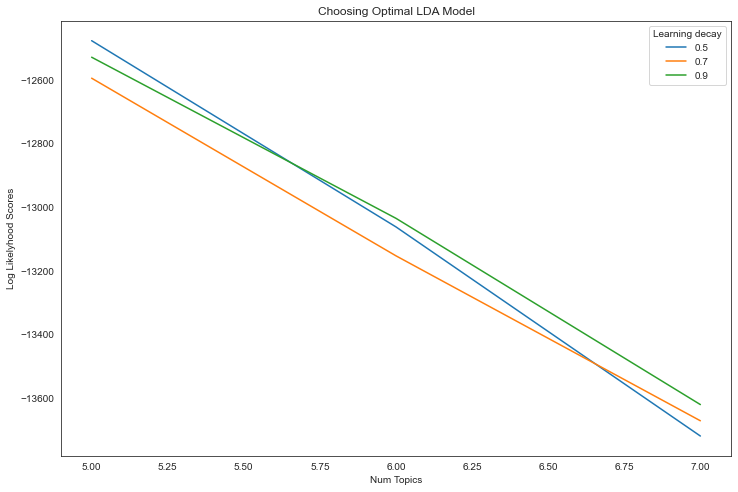

In [140]:
# Get Log Likelyhoods from Grid Search Output
n_topics = [5,6,7]
log_likelyhoods_5 = [round(model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(model.cv_results_['params']) if gscore['learning_decay']==0.5]
log_likelyhoods_7 = [round(model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(model.cv_results_['params']) if gscore['learning_decay']==0.7]
log_likelyhoods_9 = [round(model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(model.cv_results_['params']) if gscore['learning_decay']==0.9]

# Show graph
plt.figure(figsize=(12, 8))
plt.plot(n_topics, log_likelyhoods_5, label='0.5')
plt.plot(n_topics, log_likelyhoods_7, label='0.7')
plt.plot(n_topics, log_likelyhoods_9, label='0.9')
plt.title("Choosing Optimal LDA Model")
plt.xlabel("Num Topics")
plt.ylabel("Log Likelyhood Scores")
plt.legend(title='Learning decay', loc='best')
plt.show()

In [141]:
n_topics = 5

In [142]:
# Create Document - Topic Matrix
lda_output = best_lda_model.transform(tf_vectors)

# column names
topicnames = ["Topic" + str(i) for i in range(best_lda_model.n_components)]

# index names
docnames = ["Doc" + str(i) for i in range(len(X_train['Reviews']))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic

# Styling
def color_green(val):
    color = 'green' if val > .1 else 'black'
    return 'color: {col}'.format(col=color)

def make_bold(val):
    weight = 700 if val > .1 else 400
    return 'font-weight: {weight}'.format(weight=weight)

# Apply Style
df_document_topics = df_document_topic.head(15).style.applymap(color_green).applymap(make_bold)
df_document_topics

,Topic0,Topic1,Topic2,Topic3,Topic4,dominant_topic
Doc0,0.060000,0.780000,0.060000,0.060000,0.060000,1
Doc1,0.030000,0.780000,0.030000,0.030000,0.130000,1
Doc2,0.050000,0.050000,0.050000,0.780000,0.050000,3
Doc3,0.030000,0.580000,0.030000,0.030000,0.340000,1
Doc4,0.830000,0.040000,0.040000,0.040000,0.040000,0
Doc5,0.070000,0.070000,0.070000,0.070000,0.730000,4
Doc6,0.050000,0.050000,0.050000,0.050000,0.800000,4
Doc7,0.030000,0.030000,0.030000,0.040000,0.870000,4
Doc8,0.050000,0.790000,0.050000,0.050000,0.050000,1
Doc9,0.040000,0.040000,0.040000,0.040000,0.840000,4


In [143]:
df_topic_distribution = df_document_topic['dominant_topic'].value_counts().reset_index(name="Num Documents")
df_topic_distribution.columns = ['Topic Num', 'Num Documents']
df_topic_distribution

,Topic Num,Num Documents
0,1,638
1,4,390
2,0,362
3,3,351
4,2,108


In [144]:
num_words=10

vocab = np.array(vectorizer_tf.get_feature_names())

top_words = lambda t: [vocab[i] for i in np.argsort(t)[:-num_words-1:-1]]
topic_words = ([top_words(t) for t in H1])
topics = [' '.join(t) for t in topic_words]

In [145]:
topics

['couldn pleased female did dr appointment time care wrong scheduling',
 'listened issues good issues blood listened bad work gave dirty correct',
 'draw blood draw blood draw blood addressed issues addressed veins issues addressed issues small',
 'need know know need working reviewed confirmation communication email form prescriptions',
 'time appointment doctor dr staff waiting feel great friendly care']

In [146]:
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(best_lda_model, tf_vectors, vectorizer_tf, mds='tsne')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
1      150.222153  -72.269554       1        1  31.652261
4       51.163364 -159.968018       2        1  21.695351
3      -73.144554   21.523815       3        1  19.415126
0      -66.410133 -110.606438       4        1  18.548711
2       54.417324   12.443444       5        1   8.688552, topic_info=                    Term       Freq      Total Category  logprob  loglift
955              waiting  44.000000  44.000000  Default  30.0000  30.0000
93                 blood  32.000000  32.000000  Default  29.0000  29.0000
583                 need  26.000000  26.000000  Default  28.0000  28.0000
490             listened  29.000000  29.000000  Default  27.0000  27.0000
744                 room  21.000000  21.000000  Default  26.0000  26.0000
720              records  10.000000  10.000000  Default  25.0000  25.0000
257                 draw  13.000000  13.000000  Default  24.0000  24.0000
217            discussed   8.000000   8.000000  Default  23.0000  23.0000
777              service  19.000000  19.000000  Default  22.0000  22.0000
27              answered  15.000000  15.000000  Default  21.0000  21.0000
48          appointments  17.000000  17.000000  Default  20.0000  20.0000
988                 work  25.000000  25.000000  Default  19.0000  19.0000
504                 long  21.000000  21.000000  Default  18.0000  18.0000
958         waiting room   9.000000   9.000000  Default  17.0000  17.0000
28    answered questions   9.000000   9.000000  Default  16.0000  16.0000
294                 exam  11.000000  11.000000  Default  15.0000  15.0000
535                 mask   7.000000   7.000000  Default  14.0000  14.0000
492      listened issues   8.000000   8.000000  Default  13.0000  13.0000
99            blood work   7.000000   7.000000  Default  12.0000  12.0000
446               issues  36.000000  36.000000  Default  11.0000  11.0000
860                 tell  11.000000  11.000000  Default  10.0000  10.0000
92                 black  13.000000  13.000000  Default   9.0000   9.0000
584            need know   4.000000   4.000000  Default   8.0000   8.0000
245             dr black  12.000000  12.000000  Default   7.0000   7.0000
813                spent  17.000000  17.000000  Default   6.0000   6.0000
94            blood draw   8.000000   8.000000  Default   5.0000   5.0000
671             previous   9.000000   9.000000  Default   4.0000   4.0000
279            efficient  11.000000  11.000000  Default   3.0000   3.0000
498       little waiting   4.000000   4.000000  Default   2.0000   2.0000
950                 wait  21.000000  21.000000  Default   1.0000   1.0000
92                 black  12.634483  13.353540   Topic1  -5.1016   1.0950
245             dr black  11.996300  12.706491   Topic1  -5.1534   1.0928
889          time listen   8.222713   9.092974   Topic1  -5.5311   1.0498
905     took time listen   5.497357   6.206068   Topic1  -5.9337   1.0291
26      answer questions   5.309432   6.195745   Topic1  -5.9685   0.9960
60         ask questions   4.088429   4.799342   Topic1  -6.2298   0.9900
732              respect   3.706569   4.416990   Topic1  -6.3279   0.9750
300             expected   3.437134   4.154032   Topic1  -6.4034   0.9609
904            took time  16.383861  19.981680   Topic1  -4.8417   0.9518
450          just number   3.140479   3.849116   Topic1  -6.4936   0.9469
395      health concerns   3.085666   3.799505   Topic1  -6.5112   0.9423
455          kind caring   2.995483   3.706782   Topic1  -6.5409   0.9373
166              correct   3.571904   4.459619   Topic1  -6.3649   0.9284
829              started   6.062021   7.573887   Topic1  -5.8360   0.9277
789              signage   2.845890   3.557656   Topic1  -6.5921   0.9271
46   appointment started   2.829330   3.539012   Topic1  -6.5980   0.9266
499                   ll   2.849594   3.565221   Topic1  -6.5908   0.9263

In [147]:
W1 = best_lda_model.fit_transform(tf_vectors)
H1 = best_lda_model.components_

In [148]:
colnames = ["Topic" + str(i) for i in range(best_lda_model.n_components)]
docnames = ["Doc" + str(i) for i in range(len(X_train.Reviews))]
df_doc_topic = pd.DataFrame(np.round(W1, 3), columns=colnames, index=docnames)
significant_topic = np.argmax(df_doc_topic.values, axis=1)
df_doc_topic['dominant_topic'] = significant_topic

In [149]:
X_train.head()

,REVIEW_ID,MEMBER_ID,Reviews,sentiment_label
1966,a2p4w000002ODZ8AAO,0011U00000riTw8QAE,dr gray and i have always had a good rapport he is kind and takes an interest in my health even if i need to make changes i am not crazy about nothing it was a good appointment,Negative
1433,a2p4w000002NyE5AAK,0013g000006thZKAAY,i really like the new doctor dr stephen willis the doctor spent the most time going through all of my questions and truly seemed to care about my well being it was one of the better experiences i ve had with feeling listened to and that he treated me with respect as a female patient there really was nothing it was a bit of a bummer that they were not able to get my blood after trying times but my veins are tough to get it is always very hard to find someone anywhere i go that i have good luck however the lady who tried was very comforting and calm and made it an okay experience i will try going to a labcorp that they referred me to,Negative
2005,a2p4w000002OCoMAAW,0014w00003GEeFHAA1,no waiting thorough screening clear instructions i was able to obtain my prescription medications there,Negative
623,a2p3g000000Kym4AAC,0011U00000rjbyiQAA,this being the first time there i was not greeted when i walked through the door i ask do i need to stop at the desk and the lady asked well let s start with who are you i didn t feel the same welcoming that i do at my current office she never smiled and seemed to not be happy to be at work i felt more like a burden than a patient i went in as my symptoms appeared as the flu the doctor checked me and heard my concerns however i did not get tested for the flu i advised that i ve never had the flu and she based it off what i advised i didnt learn until i took my children to the doctor the same day that there was a test that was done by swabbing the nose my home never had the flu so i was unaware i did learn from my children s doctor that there were strands that were common that they can test for my son actually tested for stand b and appeared to have strand a from all the symptoms i didn t know if i still have it or not because all i did was go to the doctor to have her confirm my symptoms i did suggest to check my urine because it was abnormal color for me and it came back fine i felt that i walked out the with the same question i walked in with which was do i have the flu the doctor did have great bedside manner and seemed to care i just wished the test was performed since i was there for that reason i assume she made the decision to not test since my symptoms were getting better,Negative
1893,a2p3g000000qepHAAQ,0011U00000riXChQAM,i love dr frantz she takes her time and has really gotten to know me i never feel rushed like she rsquo s trying to get in as many appointments as possible,Negative


In [150]:
df_doc_topic

,Topic0,Topic1,Topic2,Topic3,Topic4,dominant_topic
Doc0,0.055,0.056,0.055,0.779,0.055,3
Doc1,0.105,0.030,0.030,0.805,0.030,3
Doc2,0.054,0.054,0.783,0.054,0.055,2
Doc3,0.430,0.482,0.030,0.029,0.029,1
Doc4,0.043,0.042,0.042,0.832,0.042,3
Doc5,0.068,0.068,0.070,0.724,0.070,3
Doc6,0.050,0.050,0.050,0.797,0.052,3
Doc7,0.197,0.028,0.100,0.646,0.028,3
Doc8,0.051,0.052,0.792,0.053,0.052,2
Doc9,0.038,0.041,0.039,0.843,0.039,3


In [151]:
df_doc_topic['dominant_topic'].value_counts()

3    560
2    428
4    374
1    324
0    163
Name: dominant_topic, dtype: int64

## Testing model

In [152]:
WHold = best_lda_model.transform(vectorizer_tf.transform(X_hold.Reviews))

In [153]:
colnames = ["Topic" + str(i) for i in range(best_lda_model.n_components)]
docnames = ["Doc" + str(i) for i in range(len(X_hold.Reviews))]
df_doc_topic = pd.DataFrame(np.round(WHold, 2), columns=colnames, index=docnames)
significant_topic = np.argmax(df_doc_topic.values, axis=1)
df_doc_topic['dominant_topic'] = significant_topic


In [154]:
df_doc_topic['dominant_topic'].value_counts()

3    155
2    103
4    100
1     78
0     27
Name: dominant_topic, dtype: int64

In [155]:
df_doc_topic

,Topic0,Topic1,Topic2,Topic3,Topic4,dominant_topic
Doc0,0.07,0.07,0.72,0.07,0.07,2
Doc1,0.06,0.06,0.06,0.76,0.06,3
Doc2,0.04,0.03,0.67,0.03,0.22,2
Doc3,0.05,0.06,0.05,0.78,0.05,3
Doc4,0.36,0.37,0.05,0.05,0.18,1
Doc5,0.05,0.18,0.05,0.42,0.29,3
Doc6,0.75,0.06,0.06,0.06,0.06,0
Doc7,0.05,0.05,0.79,0.05,0.05,2
Doc8,0.03,0.22,0.38,0.03,0.33,2
Doc9,0.04,0.33,0.04,0.37,0.22,3


In [156]:
joblib.dump(best_lda_model,'lda_sklearn_topic_modelling_negative.pkl')

['lda_sklearn_topic_modelling_negative.pkl']

In [157]:
lda_base = joblib.load('lda_sklearn_topic_modelling_negative.pkl') 
lda_base

LatentDirichletAllocation(batch_size=100, learning_decay=0.5, n_components=5)

In [158]:
vectorizer_tf_out = TfidfVectorizer(tokenizer=tokenize, stop_words=stop_words, max_df=0.50, min_df=2, max_features=1000, use_idf=False, norm='l2',ngram_range=(1,3))
tf_vectors_out = vectorizer_tf_out.fit_transform(docs.Reviews)

In [175]:
W1 = lda_base.fit_transform(tf_vectors_out)
H1 = lda_base.components_

In [176]:
opt_eval_2 = pd.DataFrame(data=lda_base.transform(tf_vectors_out),
                              index=docs.Reviews)
assignments_2 = docs.assign(predicted=opt_eval_2.idxmax(axis=1).values)
assignments_2

,REVIEW_ID,MEMBER_ID,Reviews,sentiment_label,Topic_negative,predicted
0,a2p1U000000Ro7KQAS,0011U00000rjF6eQAE,everything dr gray listened and offered feedback i never felt rushed i had an awesome appt thank youvant think of anything,Negative,1,1
1,a2p3g000000L0RrAAK,0011U00000riHDHQA2,friendly and professional staff clean and calm waiting room,Negative,1,0
2,a2p1U000000RoGYQA0,0011U00000rjxhBQAQ,i love that my doctor spends time with me and follows up on things we talked about during my last appointment i never feel rushed which is why i left my last doctor,Negative,1,0
3,a2p1U000000Rot5QAC,0011U00000rk4ksQAA,went in to have eye checked for possible corneal abrasion when they got the kit to check they realized they did not have the stain necessary to do so since the only kit they had was the incomplete kit it was a waste of time to go in they said they did not know when the supplies would be in needed to make arrangements to get help elsewhere did not offer the service care promised in the timely fashion promised when paladina services were pitched to us got appointment easily enough without needed to wait unfortunately even though they knew what was needed for my appointment when i called to make the appointment that morning they did not have the necessary supplies to provide the services needed was unable to get treatment or help when i arrived as the office did not have the needed supplies even though they knew what was needed when i called to make the appointment,Negative,4,3
4,a2p1U000000Ro5gQAC,0011U00000ri0GGQAY,addressed all my issues and concerns n a,Negative,2,1
5,a2p3g000000KzJ8AAK,0011U00000rjAk1QAE,dr e is always so kind and takes the time to listen and process before responding i am so grateful for your kind care the gal at the front desk is never very kind but hey i can t imagine having to interact with that many sick people everyday so i get it,Negative,2,0
6,a2p3g000000pM4OAAU,0013g000003p3hcAAA,i have difficult veins to draw blood from and they re always patient and kind which i appreciate,Negative,1,4
7,a2p3g000000L1PRAA0,0011U00000rjtsuQAA,it is so easy to get in contact with my physicians same day phone calls make it easy to assess whether you need to go into the office for care,Negative,2,0
8,a2p1U000000RoxWQAS,0011U00000rjRAnQAM,i have only had one visit with paladina so far it seems good doctor was on time and spent a lot of time with me i felt he was caring and trustworthy there was nothing that wasn t done well during my appointment,Negative,2,3
9,a2p3g000000KzprAAC,0011U00000rjbv6QAA,the doctors at my clinic always do the absolute least amount of care possible even when it is clear that testing might be warranted for diagnosis they won t even do screening tests they quickly and not thoughtfully come to a conclusion without giving the benefit of the doubt that a problem might not be just superficial you returned my call in a timely manner you didn t actually listen to my concerns rather you decided what was wrong with me before knowing all the symptoms and circumstances surrounding the onset of my symptoms,Negative,3,2


In [177]:
assignments_2.shape

(2312, 6)

In [178]:
data_ov['Topic_negative'] = assignments_2.predicted

In [179]:
data_ov.head()

,REVIEW_ID,MEMBER_ID,Reviews,sentiment_label,Topic_negative
0,a2p1U000000Ro7KQAS,0011U00000rjF6eQAE,everything dr gray listened and offered feedback i never felt rushed i had an awesome appt thank youvant think of anything,Negative,1
1,a2p3g000000L0RrAAK,0011U00000riHDHQA2,friendly and professional staff clean and calm waiting room,Negative,0
2,a2p1U000000RoGYQA0,0011U00000rjxhBQAQ,i love that my doctor spends time with me and follows up on things we talked about during my last appointment i never feel rushed which is why i left my last doctor,Negative,0
3,a2p1U000000Rot5QAC,0011U00000rk4ksQAA,went in to have eye checked for possible corneal abrasion when they got the kit to check they realized they did not have the stain necessary to do so since the only kit they had was the incomplete kit it was a waste of time to go in they said they did not know when the supplies would be in needed to make arrangements to get help elsewhere did not offer the service care promised in the timely fashion promised when paladina services were pitched to us got appointment easily enough without needed to wait unfortunately even though they knew what was needed for my appointment when i called to make the appointment that morning they did not have the necessary supplies to provide the services needed was unable to get treatment or help when i arrived as the office did not have the needed supplies even though they knew what was needed when i called to make the appointment,Negative,3
4,a2p1U000000Ro5gQAC,0011U00000ri0GGQAY,addressed all my issues and concerns n a,Negative,1


In [180]:
data_ov['Topic_negative'].value_counts()

0    843
3    827
2    430
1    112
4    100
Name: Topic_negative, dtype: int64

In [181]:
data_ov.to_csv('data_negative_topics.csv',index = False)

In [182]:
vectorizer_tf_out.get_feature_names()

['ability',
 'able',
 'absolutely',
 'absolutely love',
 'access',
 'accommodating',
 'acknowledged',
 'action',
 'actual',
 'actually',
 'addition',
 'additional',
 'address',
 'addressed',
 'addressed issues',
 'advice',
 'advised',
 'afternoon',
 'ago',
 'ahead',
 'allowed',
 'amp',
 'annual',
 'answer',
 'answer phone',
 'answer questions',
 'answered',
 'answered phone',
 'answered questions',
 'answering',
 'answering questions',
 'answers',
 'answers questions',
 'antibiotic',
 'antibiotics',
 'anxiety',
 'app',
 'apparently',
 'appointment',
 'appointment did',
 'appointment doctor',
 'appointment dr',
 'appointment scheduled',
 'appointment started',
 'appointment time',
 'appointment went',
 'appointments',
 'appreciate',
 'appreciated',
 'approach',
 'appropriate',
 'appropriate time',
 'appt',
 'apt',
 'area',
 'arm',
 'arrive',
 'arrived',
 'ask',
 'ask questions',
 'asked',
 'asked questions',
 'asking',
 'asking questions',
 'assistant',
 'attention',
 'attentive',
 'att

In [183]:
topics

['dr hester blood test dr malfese right happen testing blood work drew time appointment late',
 'appointment meet help staff friendly dr hester time appointment really care doctor office experiences refused',
 'kind caring appointment doctor office dr hester time appointment pick guys case scheduling appointment care provider',
 'time appointment doctor office file satisfied staff friendly reach dr hester continue fit took blood',
 'time appointment waiting blood work appointment rushes waited months doctor office staff friendly appreciated']

In [184]:
num_words=15

vocab = np.array(vectorizer_tf_out.get_feature_names())

top_words = lambda t: [vocab[i] for i in np.argsort(t)[:-num_words-1:-1]]
topic_words = ([top_words(t) for t in H1])
topics = [' '.join(t) for t in topic_words]

In [185]:
data_ov.shape

(2312, 5)

In [186]:
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(best_lda_model, tf_vectors_out, vectorizer_tf_out, mds='tsne')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
3      150.222153  -72.269554       1        1  25.971337
4       51.163364 -159.968018       2        1  23.687428
2      -73.144554   21.523815       3        1  19.737831
1      -66.410133 -110.606438       4        1  19.525612
0       54.417324   12.443444       5        1  11.077791, topic_info=                       Term       Freq      Total Category  logprob  loglift
92               blood test  17.000000  17.000000  Default  30.0000  30.0000
245              dr malfese  16.000000  16.000000  Default  29.0000  29.0000
93               blood work  43.000000  43.000000  Default  28.0000  28.0000
737                   right  18.000000  18.000000  Default  27.0000  27.0000
257                    drew  18.000000  18.000000  Default  26.0000  26.0000
244               dr hester  78.000000  78.000000  Default  25.0000  25.0000
748               satisfied  39.000000  39.000000  Default  24.0000  24.0000
328                 finding  18.000000  18.000000  Default  23.0000  23.0000
863                 testing  17.000000  17.000000  Default  22.0000  22.0000
744                  rushes  30.000000  30.000000  Default  21.0000  21.0000
953                  waited  21.000000  21.000000  Default  20.0000  20.0000
904               took time  24.000000  24.000000  Default  19.0000  19.0000
702             really care  18.000000  18.000000  Default  18.0000  18.0000
155                continue  33.000000  33.000000  Default  17.0000  17.0000
463                    late  14.000000  14.000000  Default  16.0000  16.0000
759  scheduling appointment  16.000000  16.000000  Default  15.0000  15.0000
568                  months  24.000000  24.000000  Default  14.0000  14.0000
720                 refused  13.000000  13.000000  Default  13.0000  13.0000
343                friendly   7.000000   7.000000  Default  12.0000  12.0000
94                bloodwork  11.000000  11.000000  Default  11.0000  11.0000
535            medical care  10.000000  10.000000  Default  10.0000  10.0000
446             kind caring  43.000000  43.000000  Default   9.0000   9.0000
325                    file  47.000000  47.000000  Default   8.0000   8.0000
574                  needed   6.000000   6.000000  Default   7.0000   7.0000
783                   sinus  10.000000  10.000000  Default   6.0000   6.0000
958            waiting room  14.000000  14.000000  Default   5.0000   5.0000
620              particular   9.000000   9.000000  Default   4.0000   4.0000
78                    began  13.000000  13.000000  Default   3.0000   3.0000
378                  happen  46.000000  46.000000  Default   2.0000   2.0000
889             time listen  11.000000  11.000000  Default   1.0000   1.0000
328                 finding  16.874320  18.005075   Topic1  -4.8489   1.2833
889             time listen  10.187735  11.097085   Topic1  -5.3535   1.2627
905        took time listen   6.678229   7.587086   Topic1  -5.7758   1.2206
528                   maybe   6.893868   8.199975   Topic1  -5.7440   1.1747
584                   notes   4.485106   5.395753   Topic1  -6.1739   1.1633
277               equipment   4.462672   5.377999   Topic1  -6.1789   1.1616
582                  normal   4.356661   5.283907   Topic1  -6.2030   1.1552
496               long time   4.195844   5.111168   Topic1  -6.2406   1.1508
822      staff professional   5.156832   6.281957   Topic1  -6.0343   1.1508
491                      ll   8.471277  10.417851   Topic1  -5.5380   1.1413
233                don feel   3.856319   4.765535   Topic1  -6.3249   1.1365
26                 answered   6.170957   7.649933   Topic1  -5.8548   1.1333
811          spent lot time   4.581098   5.688692   Topic1  -6.1527   1.1316
605                  option   5.024223   6.239979   Topic1  -6.0604   1.1315
698                    real   4.558528   5.691719   Topic1  -6.1577   1.1262
904      

In [187]:
num_words=10

vocab = np.array(vectorizer_tf_out.get_feature_names())

top_words = lambda t: [vocab[i] for i in np.argsort(t)[:-num_words-1:-1]]
topic_words = ([top_words(t) for t in H1])
topics = [' '.join(t) for t in topic_words]
topics

['dr time doctor staff feel questions felt rushed friendly care',
 'listened issues concerns time took took time addressed listen listened concerns listened issues',
 'need health blood work staff doctor did care didn dr',
 'appointment time doctor waiting did dr room called phone office',
 'blood draw rushed feel manner timely blood draw caring good staff']